Importing original SAS data

In [ ]:
import pandas as pd
from scipy import stats
import numpy as np
import zipfile as zipf
import requests
import io
import scipy
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier as knnc
from sklearn.ensemble import RandomForestClassifier as rfc
from sklearn.ensemble import VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.decomposition import KernelPCA
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
req = requests.get("https://www.cdc.gov/brfss/annual_data/2020/files/LLCP2020XPT.zip")
z = zipf.ZipFile(io.BytesIO((req.content)))
f = z.open("LLCP2020.XPT ")
df3 = pd.read_sas(f, format="xport")

/usr/local/lib/python3.7/dist-packages/pandas/io/sas/sas_xport.py:475: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  df[x] = v


In [ ]:
df3.head()

,_STATE,FMONTH,IDATE,IMONTH,IDAY,IYEAR,DISPCODE,SEQNO,_PSU,CTELENM1,PVTRESD1,COLGHOUS,STATERE1,CELPHONE,LADULT1,COLGSEX,NUMADULT,LANDSEX,NUMMEN,NUMWOMEN,RESPSLCT,SAFETIME,CTELNUM1,CELLFON5,CADULT1,CELLSEX,PVTRESD3,CCLGHOUS,CSTATE1,LANDLINE,HHADULT,SEXVAR,GENHLTH,PHYSHLTH,MENTHLTH,POORHLTH,HLTHPLN1,PERSDOC2,MEDCOST,CHECKUP1,EXERANY2,SLEPTIM1,CVDINFR4,CVDCRHD4,CVDSTRK3,ASTHMA3,ASTHNOW,CHCSCNCR,CHCOCNCR,CHCCOPD2,HAVARTH4,ADDEPEV3,CHCKDNY2,DIABETE4,DIABAGE3,LASTDEN4,RMVTETH4,MARITAL,EDUCA,RENTHOM1,NUMHHOL3,NUMPHON3,CPDEMO1B,VETERAN3,EMPLOY1,CHILDREN,INCOME2,PREGNANT,WEIGHT2,HEIGHT3,DEAF,BLIND,DECIDE,DIFFWALK,DIFFDRES,DIFFALON,SMOKE100,SMOKDAY2,STOPSMK2,LASTSMK2,USENOW3,ALCDAY5,AVEDRNK3,DRNK3GE5,MAXDRNKS,FLUSHOT7,FLSHTMY3,SHINGLE2,PNEUVAC4,FALL12MN,FALLINJ4,SEATBELT,DRNKDRI2,HADMAM,HOWLONG,HADPAP2,LASTPAP2,HPVTEST,HPLSTTST,HADHYST2,PCPSAAD3,PCPSADI1,PCPSARE1,PSATEST1,PSATIME,PCPSARS1,COLNSCPY,COLNTEST,SIGMSCPY,SIGMTEST,BLDSTOL1,LSTBLDS4,STOOLDNA,SDNATEST,VIRCOLON,VCLNTEST,HIVTST7,HIVTSTD3,HIVRISK5,PDIABTST,PREDIAB1,INSULIN1,BLDSUGAR,FEETCHK3,DOCTDIAB,CHKHEMO3,FEETCHK,EYEEXAM1,DIABEYE,DIABEDU,TOLDCFS,HAVECFS,WORKCFS,TOLDHEPC,TRETHEPC,PRIRHEPC,HAVEHEPC,HAVEHEPB,MEDSHEPB,HLTHCVR1,CIMEMLOS,CDHOUSE,CDASSIST,CDHELP,CDSOCIAL,CDDISCUS,CAREGIV1,CRGVREL4,CRGVLNG1,CRGVHRS1,CRGVPRB3,CRGVALZD,CRGVPER1,CRGVHOU1,CRGVEXPT,ECIGARET,ECIGNOW,MARIJAN1,USEMRJN2,RSNMRJN1,LCSFIRST,LCSLAST,LCSNUMCG,LCSCTSCN,CNCRDIFF,CNCRAGE,CNCRTYP1,CSRVTRT3,CSRVDOC1,CSRVSUM,CSRVRTRN,CSRVINST,CSRVINSR,CSRVDEIN,CSRVCLIN,CSRVPAIN,CSRVCTL2,PCPSADE1,PCDMDEC1,HPVADVC4,HPVADSHT,TETANUS1,IMFVPLA1,BIRTHSEX,SOMALE,SOFEMALE,TRNSGNDR,ACEDEPRS,ACEDRINK,ACEDRUGS,ACEPRISN,ACEDIVRC,ACEPUNCH,ACEHURT1,ACESWEAR,ACETOUCH,ACETTHEM,ACEHVSEX,RCSGENDR,RCSRLTN2,CASTHDX2,CASTHNO2,QSTVER,QSTLANG,_METSTAT,_URBSTAT,MSCODE,_STSTR,_STRWT,_RAWRAKE,_WT2RAKE,_IMPRACE,_CHISPNC,_CRACE1,_CPRACE,_CLLCPWT,_DUALUSE,_DUALCOR,_LLCPWT2,_LLCPWT,_RFHLTH,_PHYS14D,_MENT14D,_HCVU651,_TOTINDA,_MICHD,_LTASTH1,_CASTHM1,_ASTHMS1,_DRDXAR2,_EXTETH3,_ALTETH3,_DENVST3,_PRACE1,_MRACE1,_HISPANC,_RACE,_RACEG21,_RACEGR3,_RACEPRV,_SEX,_AGEG5YR,_AGE65YR,_AGE80,_AGE_G,HTIN4,HTM4,WTKG3,_BMI5,_BMI5CAT,_RFBMI5,_CHLDCNT,_EDUCAG,_INCOMG,_SMOKER3,_RFSMOK3,DRNKANY5,DROCDY3_,_RFBING5,_DRNKWK1,_RFDRHV7,_FLSHOT7,_PNEUMO3,_RFSEAT2,_RFSEAT3,_DRNKDRV,_RFMAM22,_MAM5023,_RFPAP35,_RFPSA23,_CLNSCPY,_SGMSCPY,_SGMS10Y,_RFBLDS4,_STOLDNA,_VIRCOLN,_SBONTIM,_CRCREC1,_AIDTST4
0,1.0,1.0,b'01042020',b'01',b'04',b'2020',1100.0,b'2020000001',2.020000e+09,1.0,1.0,NaN,1.0,2.0,1.0,NaN,1.0,2.0,5.397605e-79,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,3.0,30.0,3.0,2.0,3.0,1.0,4.0,1.0,5.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,35.0,1.0,2.0,2.0,6.0,1.0,2.0,NaN,1.0,2.0,4.0,88.0,1.0,NaN,106.0,507.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,NaN,3.0,888.0,NaN,NaN,NaN,2.0,NaN,2.0,2.0,88.0,NaN,1.0,NaN,1.0,3.0,1.0,4.0,2.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,4.0,2.0,NaN,2.0,NaN,2.0,NaN,2.0,NaN,1.0,21994.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,7.0,2.0,1.0,1.0,2.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,2.0,1.0,1.0,1.0,3.0,3.0,3.0,2.0,NaN,NaN,NaN,NaN,10.0,1.0,1.0,1.0,1.0,11011.0,69.640207,1.0,69.640207,1.0,NaN,NaN,NaN,NaN,1.0,0.465411,460.002849,284.335672,1.0,2.0,3.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,NaN,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,8.0,1.0,56.0,5.0,67.0,170.0,4808.0,1660.0,1.0,1.0,1.0,4.0,1.0,1.0,2.0,2.0,5.397605e-79,1.0,5.397605e-79,1.0,NaN,NaN,1.0,1.0,9.0,2.0,2.0,NaN,NaN,1.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,1.0
1,1.0,1.0,b'02072020',b'02',b'07',b'2020',1200.0,b'2020000002',2.020000e+09,1.0,1.0,NaN,1.0,2.0,1.0,NaN,1.0,2.0,5.397605e-79,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,3.0,88.0,88.0,NaN,1.0,1.0,1.0,1.0,1.0,7.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,3.0,NaN,1.0,1.0,3.0,6.0,1.0,1.0,1.0,1.0,2.0,7.0,88.0,99.0,NaN,170.0,504.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,NaN

In [ ]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401958 entries, 0 to 401957
Columns: 279 entries, _STATE to _AIDTST4
dtypes: float64(274), object(5)
memory usage: 855.6+ MB


In [ ]:
df3 = df3.dropna(subset = ['_MICHD'])

In [ ]:
df3['_MICHD'] =  df3['_MICHD'].replace({'Yes':1, 'No':0})

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
#there are some columns that hold no relevent information, and are just for records(ex IDATE is just the date the interview took place)that have no baring on heart disease or health
#Therefore they are dropped.

to_drop = ['IDATE', 'IMONTH', 'FMONTH', 'IYEAR', 'IDAY', 'DISPCODE', 'SEQNO', '_PSU', 'CVDINFR4', 'CVDCRHD4', 'QSTVER', 'QSTLANG', '_STSTR', '_STRWT', '_RAWRAKE', '_WT2RAKE', '_DUALUSE', '_LLCPWT2', '_AGE80', 'SEXVAR', '_LLCPWT', '_PRACE1',	'_MRACE1',	'_HISPANC',	'_RACEG21',	'_RACEGR3',	'_RACEPRV']
df= df3.drop(to_drop, axis = 'columns')

In [ ]:
pd.set_option('display.max_rows', None)
missing = df.isna().sum()
missing

_STATE           0
CTELENM1    275120
PVTRESD1    275120
COLGHOUS    398364
STATERE1    275120
CELPHONE    275120
LADULT1     275120
COLGSEX     398364
NUMADULT    275129
LANDSEX     347753
NUMMEN      289241
NUMWOMEN    289241
RESPSLCT    351406
SAFETIME    123267
CTELNUM1    123267
CELLFON5    123267
CADULT1     123271
CELLSEX     123286
PVTRESD3    123268
CCLGHOUS    397412
CSTATE1     123274
LANDLINE    123268
HHADULT     123269
GENHLTH          5
PHYSHLTH         2
MENTHLTH         2
POORHLTH    198933
HLTHPLN1         0
PERSDOC2         0
MEDCOST          0
CHECKUP1         2
EXERANY2         0
SLEPTIM1         0
CVDSTRK3         0
ASTHMA3          0
ASTHNOW     344833
CHCSCNCR         0
CHCOCNCR         0
CHCCOPD2         2
HAVARTH4         2
ADDEPEV3         3
CHCKDNY2         3
DIABETE4         3
DIABAGE3    347074
LASTDEN4         4
RMVTETH4         4
MARITAL          9
EDUCA            9
RENTHOM1        12
NUMHHOL3    275125
NUMPHON3    368442
CPDEMO1B       112
VETERAN3    

In [ ]:
#also dropped columns where >10,000 results are missing.

miss_drop = []
for i in range(len(missing)):
  if missing[i] > 10000:
    miss_drop.append(missing.index[i])

len(miss_drop)

188

In [ ]:
df= df.drop(miss_drop, axis = 'columns')

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 398387 entries, 0 to 401957
Data columns (total 64 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   _STATE    398387 non-null  float64
 1   GENHLTH   398382 non-null  float64
 2   PHYSHLTH  398385 non-null  float64
 3   MENTHLTH  398385 non-null  float64
 4   HLTHPLN1  398387 non-null  float64
 5   PERSDOC2  398387 non-null  float64
 6   MEDCOST   398387 non-null  float64
 7   CHECKUP1  398385 non-null  float64
 8   EXERANY2  398387 non-null  float64
 9   SLEPTIM1  398387 non-null  float64
 10  CVDSTRK3  398387 non-null  float64
 11  ASTHMA3   398387 non-null  float64
 12  CHCSCNCR  398387 non-null  float64
 13  CHCOCNCR  398387 non-null  float64
 14  CHCCOPD2  398385 non-null  float64
 15  HAVARTH4  398385 non-null  float64
 16  ADDEPEV3  398384 non-null  float64
 17  CHCKDNY2  398384 non-null  float64
 18  DIABETE4  398384 non-null  float64
 19  LASTDEN4  398383 non-null  float64
 20  RMVT

In [ ]:
pd.set_option('display.max_columns', None)
df.describe()

,_STATE,GENHLTH,PHYSHLTH,MENTHLTH,HLTHPLN1,PERSDOC2,MEDCOST,CHECKUP1,EXERANY2,SLEPTIM1,CVDSTRK3,ASTHMA3,CHCSCNCR,CHCOCNCR,CHCCOPD2,HAVARTH4,ADDEPEV3,CHCKDNY2,DIABETE4,LASTDEN4,RMVTETH4,MARITAL,EDUCA,RENTHOM1,CPDEMO1B,VETERAN3,EMPLOY1,CHILDREN,INCOME2,WEIGHT2,_METSTAT,_URBSTAT,_IMPRACE,_RFHLTH,_PHYS14D,_MENT14D,_HCVU651,_TOTINDA,_MICHD,_LTASTH1,_CASTHM1,_ASTHMS1,_DRDXAR2,_EXTETH3,_DENVST3,_RACE,_SEX,_AGEG5YR,_AGE65YR,_AGE_G,_RFBMI5,_CHLDCNT,_EDUCAG,_INCOMG,_SMOKER3,_RFSMOK3,DRNKANY5,DROCDY3_,_RFBING5,_DRNKWK1,_RFDRHV7,_RFSEAT2,_RFSEAT3,_DRNKDRV
count,398387.000000,398382.000000,398385.000000,398385.000000,398387.000000,398387.000000,398387.000000,398385.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398385.000000,398385.000000,398384.000000,398384.000000,398384.000000,398383.000000,398383.000000,398378.000000,398378.000000,398375.000000,398275.000000,397102.000000,395506.000000,393683.000000,391116.000000,388660.000000,391292.000000,391292.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,396462.000000,398387.000000,398387.000000,398386.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,398387.000000,3.983870e+05,398387.000000,3.983870e+05,398387.000000,398387.000000,398387.000000,398387.000000
mean,30.011255,2.446406,66.198544,61.437042,1.118335,1.448059,1.928263,1.460238,1.246381,7.903016,1.971417,1.878701,1.921699,1.920231,1.942310,1.716059,1.835736,1.978144,2.760886,1.723176,5.027687,2.384733,4.987627,1.406014,1.509517,1.899132,3.830761,65.398417,21.384988,792.501117,1.307969,1.149464,1.714602,1.169619,1.558196,1.617530,3.991144,1.248545,1.914247,1.155053,1.145625,2.813568,1.689874,1.642539,1.412401,2.176788,1.542834,7.649891,1.380881,4.342873,2.426786,1.671518,3.019202,4.898699,3.646013,1.546735,1.967002,7.566137e+01,1.742110,7.854036e+03,1.666442,1.570340,1.636923,5.634461
std,15.776609,1.081472,34.817619,36.965975,0.553541,0.881934,0.394900,1.109585,0.493677,7.770979,0.296578,0.432499,0.382799,0.383410,0.419462,0.596077,0.542939,0.339932,0.716392,1.263936,3.259876,1.796148,1.047999,0.869509,1.632989,0.491198,2.853505,37.996535,32.779642,2301.810606,0.461654,0.356546,1.463937,0.515571,1.278473,1.244638,3.799860,0.522435,0.280000,0.524761,0.695390,0.780816,0.462545,1.244551,0.930830,2.417165,0.498162,3.656871,0.525250,1.616309,2.262560,1.460352,1.035199,2.390019,1.558887,1.778019,1.872152,2.211151e+02,2.127122,2.638126e+04,2.113928,1.969124,1.965617,3.510298
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,50.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.397605e-79,1.000000,5.397605e-79,1.000000,1.000000,1.000000,1.000000
25%,18.000000,2.000000,30.000000,15.000000,1.000000,1.000000,2.000000,1.000000,1.000000,6.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,3.000000,1.000000,1.000000,1.000000,4.000000,1.000000,1.000000,2.000000,1.000000,4.000000,5.000000,150.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,1.000000,3.000000,1.000000,1.000000,2.000000,3.000000,3.000000,1.000000,1.000000,5.397605e-79,1.000000,5.397605e-79,1.000000,1.000000,1.000000,2.000000
50%,29.000000,2.000000,88.000000,88.000000,1.000000,1.000000,2.000000,1.000000,1.000000,7.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.00000

In [ ]:
df= df.rename({'WEIGHT2': 'Weight', 'PHYSHLTH': 'PhysicalHealth1', 'MENTHLTH' : 'MentalHealth', 'SLEPTIM1': 'Sleep', '_DRNKWK1': 'DrinksPerWeek', 'DROCDY3_': 'DrinkOccPerDay', '_MICHD': 'HeartDisease1'}, axis = 'columns')
df = df.rename({'_STATE':'State', 'GENHLTH': 'GeneralHealth', 'HLTHPLN1':'HealthInsurance', 'PERSDOC2': 'PrimaryDr', 'MEDCOST': 'CannotAffordDr', 'CHECKUP1': 'LastCheckUp', 'EXERANY2': 'ExtraExercise', 'CVDSTRK3': 'Stroke', 'ASTHMA3': 'Asth', 'CHCSCNCR': 'SkinCanc', 'CHCOCNCR': 'OtherCancer', 'CHCCOPD2': 'COPD', 'HAVARTH4': 'JointDisease', 'ADDEPEV3': 'Depression', 'DIABETE4' : 'Diabetes', 'CHCKDNY2': 'KidneyDis', 'LASTDEN4': 'GestationalDiabetes', 'RMVTETH4': 'ToothDecay', 'MARITAL':'MaritalStatus', 'EDUCA':'Education', 'RENTHOM1': 'RentvsOwn', 'CPDEMO1B':'Cellphones', 'VETERAN3': 'Veteran', 'EMPLOY1': 'EmploymentStatus', 'INCOME2': 'IncomeBracket', '_METSTAT': 'Metropolis', '_URBSTAT': 'UrbanvsRural', '_IMPRACE' : 'ImpRace', '_RFHLTH': 'GoodHealth', '_PHYS14D': 'PhysHealth14Days', '_MENT14D': 'MentalHealth14Days', '_HCVU651': 'HealthCoverage', '_TOTINDA': 'PhysicalActivity', '_LTASTH1': 'AdultAsthma', '_DRDXAR2': 'Arthritis', '_EXTETH3': 'TeethExtracted', '_DENVST3': 'DentalVisit', '_RACE': '_Race', '_SEX': '_Sex', '_AGEG5YR': 'AgeGroup', '_AGE65YR': 'GreaterThan65', '_AGE_G': 'AgeLevel', '_RFBMI5': 'Overweight', '_CHLDCNT': 'ChildernInHousehold', '_EDUCAG': 'EducationCompleted', '_INCOMG': 'Income', '_SMOKER3': 'SmokerStatus', '_RFSMOK3': 'Smoker', '_RFDRHV7': 'HeavyDrinker', 'DRNKANY5': 'AnyDrinks', '_RFBING5':'BingeDrink', '_RFSEAT2': 'Seatbelt', '_RFSEAT3': 'AlwaysWearSeatbelt', '_DRNKDRV': 'DrinkingandDriving', '_ASTHMS1': 'EverHadAsthma', '_CASTHM1': 'CurrentAsthma'}, axis = 'columns')

In [ ]:
cat_var_cdc = ['State', 'GeneralHealth', 'HealthInsurance', 'PrimaryDr', 'CannotAffordDr', 'LastCheckUp', 'ExtraExercise', 'Stroke', 'Asth','SkinCanc', 'OtherCancer', 'COPD', 'JointDisease', 'Depression', 'Diabetes', 'KidneyDis', 'GestationalDiabetes', 'ToothDecay', 'MaritalStatus','Education', 'RentvsOwn', 'Cellphones', 'Veteran', 'EmploymentStatus', 'IncomeBracket', 'Metropolis', 'UrbanvsRural','ImpRace', 'GoodHealth', 'PhysHealth14Days', 'MentalHealth14Days', 'HealthCoverage', 'PhysicalActivity', 'AdultAsthma', 'Arthritis', 'TeethExtracted', 'DentalVisit', '_Race', '_Sex', 'AgeGroup', 'GreaterThan65', 'AgeLevel', 'Overweight', 'ChildernInHousehold', 'EducationCompleted', 'Income', 'SmokerStatus', 'Smoker', 'HeavyDrinker', 'AnyDrinks', 'BingeDrink', 'Seatbelt', 'AlwaysWearSeatbelt', 'DrinkingandDriving', 'EverHadAsthma', 'CurrentAsthma', 'CHILDREN']
num_var_cdc = ['Weight', 'PhysicalHealth1', 'MentalHealth', 'Sleep', 'DrinksPerWeek','DrinkOccPerDay']
dep_var_cdc = ['HeartDisease1']

In [ ]:
y1 = df[['HeartDisease1']].values
y1

array([[2.],
       [2.],
       [2.],
       ...,
       [2.],
       [2.],
       [2.]])

Importing Cleaned Kaggle Data

In [ ]:
url_data = 'https://raw.githubusercontent.com/liuhong-chen/DataScienceGroup9/master/heart_2020_cleaned.csv'

In [ ]:
df2 = pd.read_csv(url_data)

In [ ]:
df2.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [ ]:
#no missing values but need to make categorical variables into numerical values.
cat_var = ['Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Sex', 'AgeCategory', 'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'Asthma', 'KidneyDisease', 'SkinCancer']
num_var = ['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
dep_var = ['HeartDisease']

In [ ]:
#This was done seperate because it is the dependent variable and didn't want to include it in our pipeline
df2['HeartDisease'] =  df2['HeartDisease'].replace({'Yes':1, 'No':0})

0    292422
1     27373
Name: HeartDisease, dtype: int64

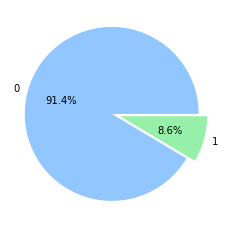

In [ ]:
def check_data_balance(series, style="seaborn-pastel"):
  with plt.style.context(style):
    unique = series.value_counts()
    display(unique) #show unique value counts of the target
    plt.pie(unique, explode=[0.05]*len(unique), labels=unique.index, autopct='%1.1f%%'); #plot a pie chart for the target to see if data are balanced
    
check_data_balance(df2['HeartDisease'])

In [ ]:

df2['Smoking'] =  df2['Smoking'].replace({'Yes':1, 'No':0})
df2['AlcoholDrinking'] =  df2['AlcoholDrinking'].replace({'Yes':1, 'No':0})
df2['Stroke'] =  df2['Stroke'].replace({'Yes':1, 'No':0})
df2['DiffWalking'] =  df2['DiffWalking'].replace({'Yes':1, 'No':0})
df2['Sex'] =  df2['Sex'].replace({'Female':1, 'Male':2})
df2['Diabetic'] =  df2['Diabetic'].replace({'No':1, 'Yes':2, 'No, borderline diabetes':3, 'Yes (during pregnancy)':4})
df2['Asthma'] =  df2['Asthma'].replace({'Yes':1, 'No':0})
df2['KidneyDisease'] =  df2['KidneyDisease'].replace({'Yes':1, 'No':0})
df2['SkinCancer'] =  df2['SkinCancer'].replace({'Yes':1, 'No':0})
df2['PhysicalActivity'] =  df2['PhysicalActivity'].replace({'Yes':1, 'No':0})
df2['GenHealth'] =  df2['GenHealth'].replace({'Very good':1, 'Good':2, 'Excellent':3, 'Fair':4, 'Poor':5})
df2['Race'] =  df2['Race'].replace({'White':1, 'Hispanic':2, 'Black':3, 'Other':4, 'Asian':5, 'American Indian/Alaskan Native':5})
df2['AgeCategory'] =  df2['AgeCategory'].replace({'18-24':1, '25-29':2, '30-34':3, '35-39':4, '40-44':5, '45-49':5, '50-54':6, '55-59':7, '55-59':8, '60-64':9, '65-69':10, '70-74':11, '75-79':12, '80 or older':13})


In [ ]:
#Check value counts in each level of the category variables
for item in cat_var:
    print(item, ":", [(x,y) for x, y in zip(df2[item].value_counts().index, df2[item].value_counts())])

Smoking : [(0, 187887), (1, 131908)]
AlcoholDrinking : [(0, 298018), (1, 21777)]
Stroke : [(0, 307726), (1, 12069)]
DiffWalking : [(0, 275385), (1, 44410)]
Sex : [(1, 167805), (2, 151990)]
AgeCategory : [(5, 42797), (10, 34151), (9, 33686), (11, 31065), (8, 29757), (6, 25382), (13, 24153), (12, 21482), (1, 21064), (4, 20550), (3, 18753), (2, 16955)]
Race : [(1, 245212), (2, 27446), (3, 22939), (5, 13270), (4, 10928)]
Diabetic : [(1, 269653), (2, 40802), (3, 6781), (4, 2559)]
PhysicalActivity : [(1, 247957), (0, 71838)]
GenHealth : [(1, 113858), (2, 93129), (3, 66842), (4, 34677), (5, 11289)]
Asthma : [(0, 276923), (1, 42872)]
KidneyDisease : [(0, 308016), (1, 11779)]
SkinCancer : [(0, 289976), (1, 29819)]


In [ ]:
df2.loc[:,dep_var + cat_var + num_var].describe()

,HeartDisease,Smoking,AlcoholDrinking,Stroke,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,Asthma,KidneyDisease,SkinCancer,BMI,PhysicalHealth,MentalHealth,SleepTime
count,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.000000,319795.00000,319795.000000,319795.000000
mean,0.085595,0.412477,0.068097,0.037740,0.138870,1.475273,7.367026,1.497781,1.194002,0.775362,2.175753,0.134061,0.036833,0.093244,28.325399,3.37171,3.898366,7.097075
std,0.279766,0.492281,0.251912,0.190567,0.345812,0.499389,3.622339,1.047108,0.496776,0.417344,1.133848,0.340718,0.188352,0.290775,6.356100,7.95085,7.955235,1.436007
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,12.020000,0.00000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,5.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,24.030000,0.00000,0.000000,6.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,8.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,0.000000,27.340000,0.00000,0.000000,7.000000
75%,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000,10.000000,1.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,31.420000,2.00000,3.000000,8.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,13.000000,5.000000,4.000000,1.000000,5.000000,1.000000,1.000000,1.000000,94.850000,30.00000,30.000000,24.000000


In [ ]:
y = df2[['HeartDisease']].values
y

array([[0],
       [0],
       [0],
       ...,
       [0],
       [0],
       [0]])

<Figure size 2880x2880 with 0 Axes>

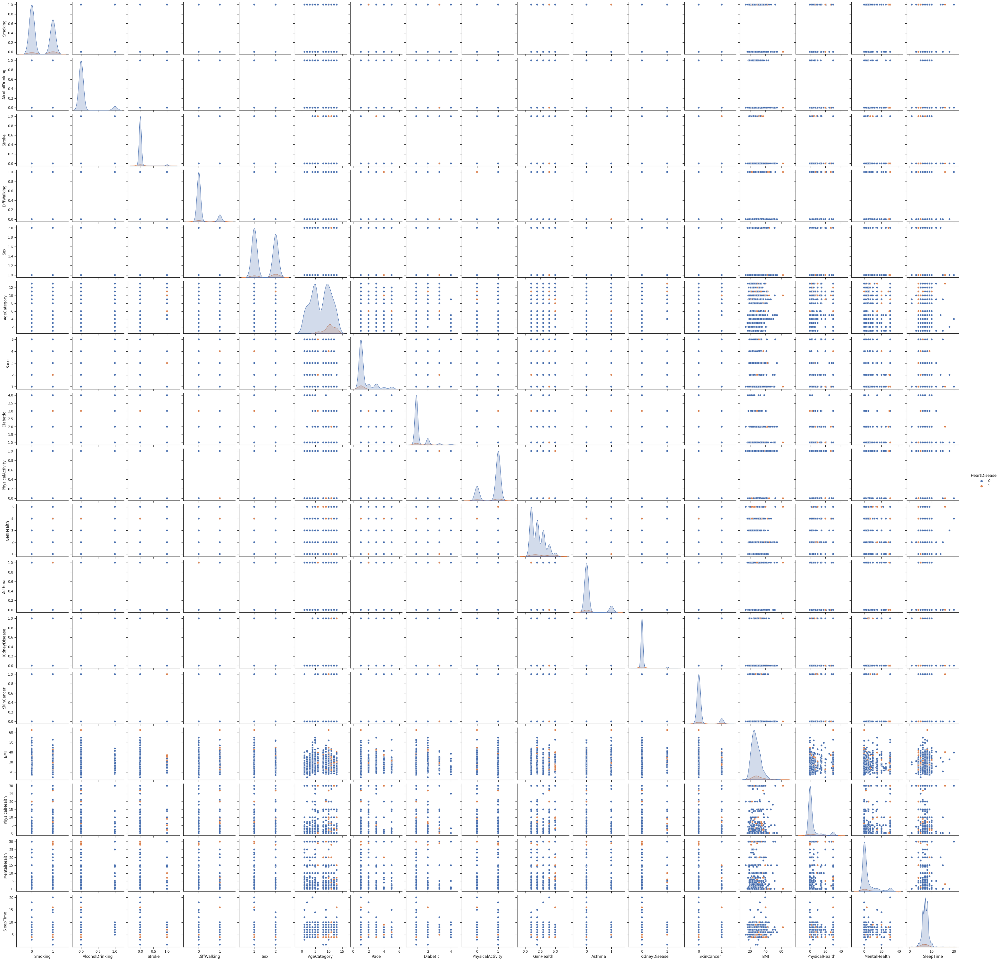

In [ ]:
# To plot pretty figures
%matplotlib inline

plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
sns.set_style("whitegrid")

sns.set(style='ticks')
plt.figure(figsize=(40,40))
sns.pairplot(data=df2.loc[:,dep_var + cat_var + num_var].sample(1000,random_state=123), hue='HeartDisease')

In [ ]:
#split the data into training and test sets
X = df2[cat_var + num_var]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, stratify=y)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(255836, 17) (63959, 17) (255836, 1) (63959, 1)


In [ ]:
cat_ohe_step = ('ohe', OneHotEncoder(sparse=False, handle_unknown='ignore'))
cat_pipe = Pipeline([cat_ohe_step])
cat_transformers = [('cat', cat_pipe, cat_var)]

num_scl_step = ('scl', StandardScaler())
num_pipe = Pipeline([num_scl_step])
num_transformers = [('num', num_pipe, num_var)]

ct = ColumnTransformer(transformers=num_transformers + cat_transformers)
ct.fit(X_train)
X_train_transformed = ct.transform(X_train)
X_test_transformed = ct.transform(X_test)

In [ ]:
#use Logistic regression, KNN and RandomForest classifiers
classifiers = [
    LogisticRegression() ,
    knnc(),
    rfc(),
]
classifier_names = [
    'Logistic regression',
    'K nearest neighbors',
    'Random Forest Classifier',
]

for clf, clf_name in zip(classifiers, classifier_names):
    cv_scores = cross_val_score(clf, X_train_transformed, np.ravel(y_train), cv=5)
    print(clf_name, ' mean accuracy: ', round(cv_scores.mean()*100, 3), '% std: ', round(cv_scores.var()*100, 3),'%')

Logistic regression  mean accuracy:  91.586 % std:  0.0 %
K nearest neighbors  mean accuracy:  90.649 % std:  0.0 %
Random Forest Classifier  mean accuracy:  90.322 % std:  0.0 %


Logistic regression  mean accuracy:  91.586 % std:  0.0 %
K nearest neighbors  mean accuracy:  90.634 % std:  0.0 %
Random Forest Classifier  mean accuracy:  90.353 % std:  0.0 %

In [ ]:
#Use decision tree classifier
tree_clf = DecisionTreeClassifier(max_depth=10, criterion='gini')
cv_scores = cross_val_score(tree_clf, X_train_transformed, np.ravel(y_train), cv=5)
print('Decision Tree classifier', ' mean accuracy: ', round(cv_scores.mean()*100, 3), '% std: ', round(cv_scores.var()*100, 3),'%')

Decision Tree classifier  mean accuracy:  91.332 % std:  0.0 %


Decision Tree classifier  mean accuracy:  91.344 % std:  0.0 %

In [ ]:
#use ensemble voting classifier
log_clf = LogisticRegression()
rfc_clf = rfc()
knn_clf = knnc()

voting_clf = VotingClassifier(
    estimators=[('lr', log_clf), ('rf', rfc_clf), ('knn', knn_clf) ],
    voting='soft')

cv_scores = cross_val_score(voting_clf, X_train_transformed, np.ravel(y_train), cv=5)
print('voting classifier', ' mean accuracy: ', round(cv_scores.mean()*100, 3), '% std: ', round(cv_scores.var()*100, 3),'%')

voting classifier  mean accuracy:  91.393 % std:  0.0 %

In [ ]:
#training with default parameters
logr_clf = LogisticRegression().fit(X_train_transformed, np.ravel(y_train))
knnc_clf = knnc().fit(X_train_transformed, np.ravel(y_train))
rfc_clf = rfc().fit(X_train_transformed, np.ravel(y_train))
vt_clf = voting_clf.fit(X_train_transformed, np.ravel(y_train))
dt_clf = tree_clf.fit(X_train_transformed, np.ravel(y_train))

In [ ]:
#predict
yhat_logr = logr_clf.predict(X_test_transformed)
yhat_knnc = knnc_clf.predict(X_test_transformed)
yhat_rfc = rfc_clf.predict(X_test_transformed)
yhat_vt = vt_clf.predict(X_test_transformed)
yhat_dt = dt_clf.predict(X_test_transformed)
print('test accuracy for Logistic Regression:'\
      , round(accuracy_score(y_test, yhat_logr)*100, 2), '%')
print('test accuracy for KNN classifier:'\
      , round(accuracy_score(y_test, yhat_knnc)*100, 2), '%')
print('test accuracy for Random Forest classifier:'\
      , round(accuracy_score(y_test, yhat_rfc)*100, 2), '%')
print('test accuracy for Voting Classifier:'\
      , round(accuracy_score(y_test, yhat_vt)*100, 2), '%')
print('test accuracy for Decision tree classifier:'\
      , round(accuracy_score(y_test, yhat_dt)*100, 2), '%')

test accuracy for Logistic Regression: 91.64 %
test accuracy for KNN classifier: 90.61 %
test accuracy for Random Forest classifier: 90.23 %
test accuracy for Voting Classifier: 91.39 %
test accuracy for Decision tree classifier: 91.38 %

In [ ]:
#confusion matrix


plt.title('Confusion matrix for Logistic Regression')
sns.heatmap(confusion_matrix(y_test, yhat_logr), annot=True, cmap="YlGn")
plt.xlabel('Predicted classes')
plt.ylabel('True Classes')
plt.show()
print('Precision score:', precision_score(y_test, yhat_logr))
print('Recall score:', recall_score(y_test, yhat_logr))
print('F1 score:', f1_score(y_test, yhat_logr))

plt.title('Confusion matrix for KNN classifier')
sns.heatmap(confusion_matrix(y_test, yhat_knnc), annot=True, cmap="YlGn")
plt.xlabel('Predicted classes')
plt.ylabel('True Classes')
plt.show()
print('Precision score:', precision_score(y_test, yhat_knnc))
print('Recall score:', recall_score(y_test, yhat_knnc))
print('F1 score:', f1_score(y_test, yhat_knnc))

plt.title('Confusion matrix for Random Forest classifier')
sns.heatmap(confusion_matrix(y_test, yhat_rfc), annot=True, cmap="YlGn")
plt.xlabel('Predicted classes')
plt.ylabel('True Classes')
plt.show()
print('Precision score:', precision_score(y_test, yhat_rfc))
print('Recall score:', recall_score(y_test, yhat_rfc))
print('F1 score:', f1_score(y_test, yhat_rfc))

plt.title('Confusion matrix for Voting classifier')
sns.heatmap(confusion_matrix(y_test, yhat_vt), annot=True, cmap="YlGn")
plt.xlabel('Predicted classes')
plt.ylabel('True Classes')
plt.show()
print('Precision score:', precision_score(y_test, yhat_vt))
print('Recall score:', recall_score(y_test, yhat_vt))
print('F1 score:', f1_score(y_test, yhat_vt))

plt.title('Confusion matrix for Decision tree classifier')
sns.heatmap(confusion_matrix(y_test, yhat_dt), annot=True, cmap="YlGn")
plt.xlabel('Predicted classes')
plt.ylabel('True Classes')
plt.show()
print('Precision score:', precision_score(y_test, yhat_dt))
print('Recall score:', recall_score(y_test, yhat_dt))
print('F1 score:', f1_score(y_test, yhat_dt))

In [ ]:
#ROC curves and AUC

y_scores = knnc_clf.predict_proba(X_test_transformed)
fpr, tpr, thresholds = roc_curve(y_test, y_scores[:,1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label="AUC = %0.2f" % roc_auc)
plt.xlabel("FPR")
plt.ylabel("TPR (recall)")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.title("ROC curve of KNN Classifier")
plt.show()

y_scores = logr_clf.predict_proba(X_test_transformed)
fpr, tpr, thresholds = roc_curve(y_test, y_scores[:,1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label="AUC = %0.2f" % roc_auc)
plt.xlabel("FPR")
plt.ylabel("TPR (recall)")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.title("ROC curve of Logistic Regression")
plt.show()

y_scores = rfc_clf.predict_proba(X_test_transformed)
fpr, tpr, thresholds = roc_curve(y_test, y_scores[:,1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label="AUC = %0.2f" % roc_auc)
plt.xlabel("FPR")
plt.ylabel("TPR (recall)")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.title("ROC curve of RandomForest Classifier")
plt.show()


y_scores = vt_clf.predict_proba(X_test_transformed)
fpr, tpr, thresholds = roc_curve(y_test, y_scores[:,1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label="AUC = %0.2f" % roc_auc)
plt.xlabel("FPR")
plt.ylabel("TPR (recall)")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.title("ROC curve of Voting Classifier")
plt.show()

y_scores = dt_clf.predict_proba(X_test_transformed)
fpr, tpr, thresholds = roc_curve(y_test, y_scores[:,1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label="AUC = %0.2f" % roc_auc)
plt.xlabel("FPR")
plt.ylabel("TPR (recall)")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.title("ROC curve of Decision Tree Classifier")
plt.show()

#Run logistic regression on cdc data

In [ ]:
for var in num_var_cdc + cat_var_cdc:
  print(var, df['HeartDisease1'].corr(df[var]))

Weight 0.024429416653070964
PhysicalHealth1 0.09892590284586422
MentalHealth -0.019376363303225005
Sleep -0.023226107706945155
DrinksPerWeek 0.013005293395784821
DrinkOccPerDay 0.015612743653025113
State 0.0006100056299840146
GeneralHealth -0.23805191182805385
HealthInsurance 0.02649011707154282
PrimaryDr 0.055582032203000564
CannotAffordDr 0.002162444675454915
LastCheckUp 0.0714308591879463
ExtraExercise -0.08866899131481075
Stroke 0.10569043559597982
Asth 0.031590335808355824
SkinCanc 0.0665569546134737
OtherCancer 0.06160700427917115
COPD 0.0966257316521188
JointDisease 0.127666952812052
Depression 0.02853633957162962
Diabetes 0.16544699286845846
KidneyDis 0.05831810252588865
GestationalDiabetes -0.06903485431829645
ToothDecay 0.12998319352941842
MaritalStatus 0.04081442380356579
Education 0.06824108106195532
RentvsOwn 0.024098235371913093
Cellphones -0.05410726643876905
Veteran 0.07595381256605223
EmploymentStatus -0.2013179870249318
IncomeBracket -0.0028716971623069256
Metropolis 

In [ ]:
df['HeartDisease1'] = 2 - df['HeartDisease1'].astype(int)


In [ ]:
y1 = df[['HeartDisease1']].values
y1

array([[0],
       [0],
       [0],
       ...,
       [0],
       [0],
       [0]])

0    364224
1     34163
dtype: int64

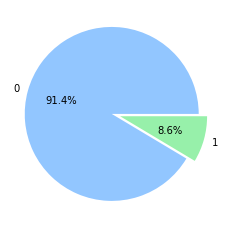

In [ ]:
def check_data_balance(series, style="seaborn-pastel"):
  with plt.style.context(style):
    unique = series.value_counts()
    display(unique) #show unique value counts of the target
    plt.pie(unique, explode=[0.05]*len(unique), labels=unique.index, autopct='%1.1f%%'); #plot a pie chart for the target to see if data are balanced
    
check_data_balance(pd.Series(y1.flatten()))

In [ ]:
for col in cat_var_cdc:
  df[col] = df[col].astype('str')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 398387 entries, 0 to 401957
Data columns (total 64 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   State                398387 non-null  object 
 1   GeneralHealth        398387 non-null  object 
 2   PhysicalHealth1      398385 non-null  float64
 3   MentalHealth         398385 non-null  float64
 4   HealthInsurance      398387 non-null  object 
 5   PrimaryDr            398387 non-null  object 
 6   CannotAffordDr       398387 non-null  object 
 7   LastCheckUp          398387 non-null  object 
 8   ExtraExercise        398387 non-null  object 
 9   Sleep                398387 non-null  float64
 10  Stroke               398387 non-null  object 
 11  Asth                 398387 non-null  object 
 12  SkinCanc             398387 non-null  object 
 13  OtherCancer          398387 non-null  object 
 14  COPD                 398387 non-null  object 
 15  JointDisease     

In [ ]:
#split the data into training and test sets
X_cdc = df[cat_var_cdc + num_var_cdc]
X_train_cdc, X_test_cdc, y_train_cdc, y_test_cdc = train_test_split(X_cdc, y1, test_size=0.2, random_state=123, stratify=y1)
print(X_train_cdc.shape, X_test_cdc.shape, y_train_cdc.shape, y_test_cdc.shape)

(318709, 63) (79678, 63) (318709, 1) (79678, 1)


In [ ]:
cat_si_step_cdc = ('si', SimpleImputer(strategy='constant', fill_value='Other'))
cat_ohe_step_cdc = ('ohe', OneHotEncoder(sparse=False, handle_unknown='ignore'))
cat_pipe_cdc = Pipeline([cat_si_step_cdc, cat_ohe_step_cdc])
cat_transformers_cdc = [('cat', cat_pipe_cdc, cat_var_cdc)]

num_si_step_cdc = ('si', SimpleImputer(strategy='median'))
num_scl_step_cdc = ('scl', StandardScaler())
num_pipe_cdc = Pipeline([num_si_step_cdc, num_scl_step_cdc])
num_transformers_cdc = [('num', num_pipe_cdc, num_var_cdc)]

ct_cdc = ColumnTransformer(transformers=num_transformers_cdc + cat_transformers_cdc)
ct_cdc.fit(X_train_cdc)
X_train_transformed_cdc = ct_cdc.transform(X_train_cdc)
X_test_transformed_cdc = ct_cdc.transform(X_test_cdc)

In [ ]:
#use Logistic regression for cross validation
classifiers = [
    LogisticRegression(max_iter=1000),
]
classifier_names = [
    'Logistic regression',
]

for clf, clf_name in zip(classifiers, classifier_names):
    cv_scores = cross_val_score(clf, X_train_transformed_cdc, np.ravel(y_train_cdc), cv=5)
    print(clf_name, ' mean accuracy: ', round(cv_scores.mean()*100, 3), '% std: ', round(cv_scores.var()*100, 3),'%')

Logistic regression  mean accuracy:  91.624 % std:  0.0 %


In [ ]:
#training with default parameters
logr_clf = LogisticRegression(max_iter=1000).fit(X_train_transformed_cdc, np.ravel(y_train_cdc))


In [ ]:
#predict
yhat_logr = logr_clf.predict(X_test_transformed_cdc)
print('test accuracy for Logistic Regression:'\
      , round(accuracy_score(y_test_cdc, yhat_logr)*100, 2), '%')

test accuracy for Logistic Regression: 91.65 %


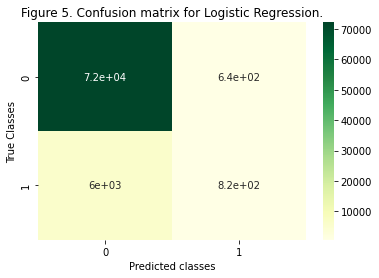

Precision score: 0.5606267029972752
Recall score: 0.12044489975120738
F1 score: 0.19828936272738226


In [ ]:
#confusion matrix


plt.title('Figure 5. Confusion matrix for Logistic Regression.')
sns.heatmap(confusion_matrix(y_test_cdc, yhat_logr), annot=True, cmap="YlGn")
plt.xlabel('Predicted classes')
plt.ylabel('True Classes')
plt.show()
print('Precision score:', precision_score(y_test_cdc, yhat_logr))
print('Recall score:', recall_score(y_test_cdc, yhat_logr))
print('F1 score:', f1_score(y_test_cdc, yhat_logr))


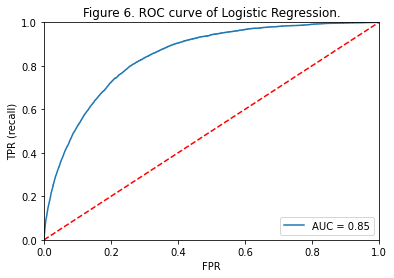

In [ ]:
#ROC curve
y_scores = logr_clf.predict_proba(X_test_transformed_cdc)
fpr, tpr, thresholds = roc_curve(y_test_cdc, y_scores[:,1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label="AUC = %0.2f" % roc_auc)
plt.xlabel("FPR")
plt.ylabel("TPR (recall)")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.title("Figure 6. ROC curve of Logistic Regression.")
plt.show()

Dimensionality Reduction

In this section we used the X_train_transformed /y_trai (test) created from df2 (Kaggle data) in the cells above

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=123, stratify=y)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
X_train_transformed = ct.transform(X_train)
X_test_transformed = ct.transform(X_test)

(159897, 17) (159898, 17) (159897, 1) (159898, 1)


We've tried different values of test/train size:
- 0.2/0.8 - too slow, more than 1 hour of processing 
- 0.8/0.2 - values in y_train is unevenly distributed
-0.5/0.5 - used below

Trying PCA reducer

In [ ]:
%%time

df_pipe = X_train_transformed

reducer = PCA(n_components=0.95)
X_reduced = reducer.fit_transform(df_pipe)
display(X_reduced.shape)

fig = px.scatter(x=X_reduced[:,0], y=X_reduced[:,1] ,color = y_train [:,0],title="PCA")
fig.update_layout(coloraxis_colorbar=dict(title='Heart Disease'), height=1000)
fig.update_yaxes(scaleanchor = "x", scaleratio = 1)
fig.show()

(159897, 26)

CPU times: user 3.13 s, sys: 420 ms, total: 3.55 s
Wall time: 4.15 s


It can be seen that the data is slightly grouped into clusters.

In [ ]:
#Use reduced X
X = pd.DataFrame(X_reduced)
y = y_train

In [ ]:
%%time 

max_features = 100
num_trees = 10 #
results_rfc = cross_val_score(rfc(n_estimators=num_trees,
                                  max_features=max_features), 
                              X_train, 
                              y_train,
                              cv=5)
print('RFC', ' mean accuracy: ', round(results_rfc.mean()*100, 3), 
      '% std: ', round(results_rfc.var()*100, 3),'%')

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RFC  mean accuracy:  nan % std:  nan %
CPU times: user 376 ms, sys: 11.1 ms, total: 387 ms
Wall time: 432 ms


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning:


5 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File

RFC  mean accuracy is NAN , that means that this model cannot be applied to reduce the features

Trying t-SNE reducer

In [ ]:
# Trying t-SNE reducer
%%time

reducer = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
X_reduced = reducer.fit_transform(X_train_transformed)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 159897 samples in 0.008s...
[t-SNE] Computed neighbors for 159897 samples in 606.806s...
[t-SNE] Computed conditional probabilities for sample 1000 / 159897
[t-SNE] Computed conditional probabilities for sample 2000 / 159897
[t-SNE] Computed conditional probabilities for sample 3000 / 159897
[t-SNE] Computed conditional probabilities for sample 4000 / 159897
[t-SNE] Computed conditional probabilities for sample 5000 / 159897
[t-SNE] Computed conditional probabilities for sample 6000 / 159897
[t-SNE] Computed conditional probabilities for sample 7000 / 159897
[t-SNE] Computed conditional probabilities for sample 8000 / 159897
[t-SNE] Computed conditional probabilities for sample 9000 / 159897
[t-SNE] Computed conditional probabilities for sample 10000 / 159897
[t-SNE] Computed conditional probabilities for sample 11000 / 159897
[t-SNE] Computed conditional probabilities for sample 12000 / 159897
[t-SNE] Computed conditional prob

CPU times: user 48min 39s, sys: 5.09 s, total: 48min 44s
Wall time: 28min 2s

KL divergence is high after 250, but low after 300 iterations, therefore we have matched the true distribution in our approximation. Mean sigma: 0.371409 - the reduction may be possible 

In [ ]:
X_reduced.shape

(159897, 2)

In [ ]:
fig = px.scatter(x=X_reduced[:,0], y=X_reduced[:,1] ,color = y_train [:,0],title="t-SNE")
fig.update_layout(coloraxis_colorbar=dict(title='Heart Disease'), height=1000)
fig.update_yaxes(scaleanchor = "x", scaleratio = 1)
fig.show()

We've tried t-SNE with different TSNE parameters values, and got the similar results.

Even with the high level of reduction we've received, it can be seen that the data cannot beclustered by t-SNE reducer.

Feature selection approaches

Since Dimensionaly reduction does not work for the data, we use stepwise selection method to identify the Relative importance of the features

Text(0.5, 0, 'Relative Importance')

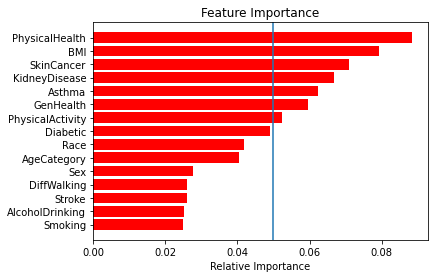

In [ ]:
#Forward stepwise selection of the feature importance
stepwise_model = rfc(random_state=1, max_depth=10)

stepwise_model.fit(X_train_transformed, y_train.ravel() )

importances = stepwise_model.feature_importances_
indices = np.argsort(importances)[-15:]
feature_names = cat_var + num_var
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in range(len(indices))])
plt.axvline(x=0.05,label='relative importance = 0.05')
plt.xlabel('Relative Importance')

Text(0.5, 0, 'Relative Importance')

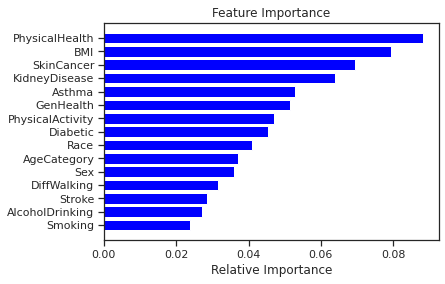

In [ ]:
#Check the TEST data
stepwise_model = rfc(random_state=1, max_depth=10)

stepwise_model.fit(X_test_transformed, y_test.ravel() )

importances = stepwise_model.feature_importances_
indices = np.argsort(importances)[-15:]
feature_names = cat_var + num_var
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='blue', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in range(len(indices))])
plt.xlabel('Relative Importance')

CONCLUSION: 
- We've tried dimensionality reduction and 2 algorithms showed the same result, dimensionality reduction cannot be applied to the dataset. In other words, all features should be included in predicting models. 
- Stepwise selection method shown that the most important features are "PhysicalHealth" and "BMI" (it was expected). 
- It is interesting, that the next important indicator of Heart Disease is "SkinCancer", that has more relative weight than, for example, "Age Category", or "Sex", or even "Smoking"
- The test/train results for Stepwise selection have been similar that confirms the method relavance.

In [ ]:
#test classifiers with the most important features - relative importance < .05
X_revised = df2[["PhysicalHealth","BMI","SkinCancer","KidneyDisease","Asthma","GenHealth","PhysicalActivity"]]
y_revised = df2[['HeartDisease']]

cat_var_r = ['PhysicalActivity', 'GenHealth', 'Asthma', 'KidneyDisease', 'SkinCancer']
num_var_r = ['BMI', 'PhysicalHealth']

X_r = df2[cat_var_r + num_var_r]

X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(X_r, y_revised, test_size=0.2, random_state=123, stratify=y_revised)

cat_ohe_step_r = ('ohe', OneHotEncoder(sparse=False, handle_unknown='ignore'))
cat_pipe_r = Pipeline([cat_ohe_step_r])
cat_transformers_r = [('cat', cat_pipe_r, cat_var_r)]

num_scl_step_r = ('scl', StandardScaler())
num_pipe_r = Pipeline([num_scl_step_r])
num_transformers_r = [('num', num_pipe_r, num_var_r)]

ct_r = ColumnTransformer(transformers=num_transformers_r + cat_transformers_r)
ct_r.fit(X_train_r)
X_train_transformed_r = ct_r.transform(X_train_r)
X_test_transformed_r = ct_r.transform(X_test_r)

#Logistic Regression model Cross validation
classifiers_r = [
    LogisticRegression(max_iter=1000),
]
classifier_names_r = [
    'Logistic regression',
]

for clf_r, clf_name_r in zip(classifiers_r, classifier_names_r):
    cv_scores_r = cross_val_score(clf_r, X_train_transformed_r, np.ravel(y_train_r), cv=5)
    print(clf_name_r, ' mean accuracy: ', round(cv_scores_r.mean()*100, 3), '% std: ', round(cv_scores_r.var()*100, 3),'%')

Logistic regression  mean accuracy:  91.434 % std:  0.0 %


In [ ]:
logr_clf_r = LogisticRegression(max_iter=1000).fit(X_train_transformed_r, np.ravel(y_train_r))
yhat_logr_r = logr_clf_r.predict(X_test_transformed_r)
print('test accuracy for Logistic Regression:'\
      , round(accuracy_score(y_test_r, yhat_logr_r)*100, 2), '%')

test accuracy for Logistic Regression: 91.44 %


In [ ]:
print('Precision score:', precision_score(y_test_r, yhat_logr_r))
print('Recall score:', recall_score(y_test_r, yhat_logr_r))
print('F1 score:', f1_score(y_test_r, yhat_logr_r))

Precision score: 0.4857142857142857
Recall score: 0.027945205479452055
F1 score: 0.05284974093264249


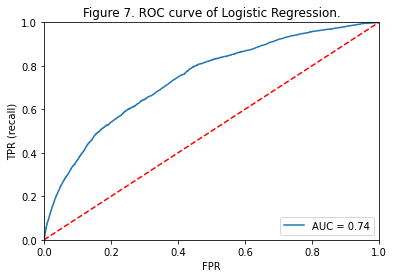

In [ ]:
#ROC curve
y_scores_r = logr_clf_r.predict_proba(X_test_transformed_r)
fpr, tpr, thresholds = roc_curve(y_test_r, y_scores_r[:,1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label="AUC = %0.2f" % roc_auc)
plt.xlabel("FPR")
plt.ylabel("TPR (recall)")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.title("Figure 7. ROC curve of Logistic Regression.")
plt.show()

Exploring the CDC data

In [ ]:
pd.set_option('display.max_rows', None)
infiniteData = np.isfinite(df).sum()
infiniteData

State                  398387
GeneralHealth          398382
PhysicalHealth1        398385
MentalHealth           398385
HealthInsurance        398387
PrimaryDr              398387
CannotAffordDr         398387
LastCheckUp            398385
ExtraExercise          398387
Sleep                  398387
Stroke                 398387
Asth                   398387
SkinCanc               398387
OtherCancer            398387
COPD                   398385
JointDisease           398385
Depression             398384
KidneyDis              398384
Diabetes               398384
GestationalDiabetes    398383
ToothDecay             398383
MaritalStatus          398378
Education              398378
RentvsOwn              398375
Cellphones             398275
Veteran                397102
EmploymentStatus       395506
CHILDREN               393683
IncomeBracket          391116
Weight                 388660
Metropolis             391292
UrbanvsRural           391292
ImpRace                398387
GoodHealth

In [ ]:
infD_drop = []
for i in range(len(infiniteData)):
  if infiniteData[i] < 398387:
    infD_drop.append(infiniteData.index[i])

len(infD_drop)

24

In [ ]:
df= df.drop(infD_drop, axis = 'columns')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 398387 entries, 0 to 401957
Data columns (total 40 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   State                398387 non-null  float64
 1   HealthInsurance      398387 non-null  float64
 2   PrimaryDr            398387 non-null  float64
 3   CannotAffordDr       398387 non-null  float64
 4   ExtraExercise        398387 non-null  float64
 5   Sleep                398387 non-null  float64
 6   Stroke               398387 non-null  float64
 7   Asth                 398387 non-null  float64
 8   SkinCanc             398387 non-null  float64
 9   OtherCancer          398387 non-null  float64
 10  ImpRace              398387 non-null  float64
 11  GoodHealth           398387 non-null  float64
 12  PhysHealth14Days     398387 non-null  float64
 13  MentalHealth14Days   398387 non-null  float64
 14  HealthCoverage       398387 non-null  float64
 15  PhysicalActivity 

In [ ]:
pd.set_option('display.max_columns', None)
df.head()

,State,HealthInsurance,PrimaryDr,CannotAffordDr,ExtraExercise,Sleep,Stroke,Asth,SkinCanc,OtherCancer,ImpRace,GoodHealth,PhysHealth14Days,MentalHealth14Days,HealthCoverage,PhysicalActivity,HeartDisease1,AdultAsthma,CurrentAsthma,EverHadAsthma,TeethExtracted,DentalVisit,_Sex,AgeGroup,GreaterThan65,AgeLevel,Overweight,ChildernInHousehold,EducationCompleted,Income,SmokerStatus,Smoker,AnyDrinks,DrinkOccPerDay,BingeDrink,DrinksPerWeek,HeavyDrinker,Seatbelt,AlwaysWearSeatbelt,DrinkingandDriving
0,1.0,2.0,3.0,1.0,1.0,5.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,8.0,1.0,5.0,1.0,1.0,4.0,1.0,1.0,2.0,2.0,5.397605e-79,1.0,5.397605e-79,1.0,1.0,1.0,9.0
1,1.0,1.0,1.0,1.0,1.0,7.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,9.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,10.0,2.0,6.0,2.0,1.0,4.0,9.0,9.0,9.0,9.0,9.000000e+02,9.0,9.990000e+04,9.0,9.0,9.0,9.0
2,1.0,1.0,1.0,2.0,1.0,7.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,9.0,1.0,2.0,1.0,1.0,3.0,9.0,1.0,2.0,10.0,2.0,6.0,9.0,1.0,3.0,5.0,4.0,1.0,2.0,5.397605e-79,1.0,5.397605e-79,1.0,1.0,1.0,9.0
3,1.0,1.0,3.0,2.0,2.0,6.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,9.0,2.0,2.0,1.0,1.0,3.0,2.0,9.0,2.0,13.0,2.0,6.0,9.0,1.0,2.0,9.0,4.0,1.0,2.0,5.397605e-79,1.0,5.397605e-79,1.0,1.0,1.0,9.0
4,1.0,1.0,1.0,2.0,1.0,7.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,9.0,1.0,2.0,1.0,1.0,3.0,1.0,9.0,2.0,13.0,2.0,6.0,1.0,1.0,4.0,9.0,4.0,1.0,2.0,5.397605e-79,1.0,5.397605e-79,1.0,1.0,1.0,9.0


In [ ]:
cat_var_cdc2 = ['State', 'HealthInsurance', 'PrimaryDr', 'CannotAffordDr', 'ExtraExercise', 'Stroke', 'Asth','SkinCanc', 'OtherCancer','ImpRace', 'GoodHealth', 'PhysHealth14Days', 'MentalHealth14Days', 'HealthCoverage', 'PhysicalActivity', 'AdultAsthma', 'TeethExtracted', 'DentalVisit', '_Sex', 'AgeGroup', 'GreaterThan65', 'AgeLevel', 'Overweight', 'ChildernInHousehold', 'EducationCompleted', 'Income', 'SmokerStatus', 'Smoker', 'HeavyDrinker', 'AnyDrinks', 'BingeDrink', 'Seatbelt', 'AlwaysWearSeatbelt', 'DrinkingandDriving', 'EverHadAsthma', 'CurrentAsthma']
num_var_cdc2 = ['Sleep', 'DrinksPerWeek','DrinkOccPerDay']
dep_var_cdc2 = ['HeartDisease1']

In [ ]:
#split the data into training and test sets
X_cdc = df[cat_var_cdc2 + num_var_cdc2]
X_train_cdc, X_test_cdc, y_train_cdc, y_test_cdc = train_test_split(X_cdc, y1, test_size=0.2, random_state=123, stratify=y1)

In [ ]:
cat_ohe_step_cdc = ('ohe', OneHotEncoder(sparse=False, handle_unknown='ignore'))
cat_pipe_cdc = Pipeline([cat_ohe_step_cdc])
cat_transformers_cdc = [('cat', cat_pipe_cdc, cat_var_cdc2)]

num_scl_step_cdc = ('scl', StandardScaler())
num_pipe_cdc = Pipeline([num_scl_step_cdc])
num_transformers_cdc = [('num', num_pipe_cdc, num_var_cdc2)]

ct_cdc = ColumnTransformer(transformers=num_transformers_cdc + cat_transformers_cdc)
ct_cdc.fit(X_train_cdc)
X_train_transformed_cdc = ct_cdc.transform(X_train_cdc)
X_test_transformed_cdc = ct_cdc.transform(X_test_cdc)

Text(0.5, 0, 'Relative Importance')

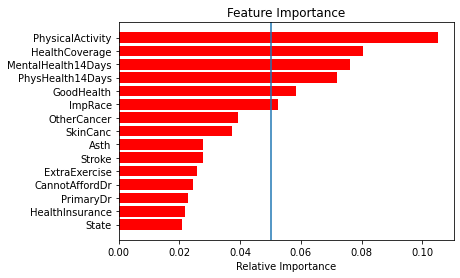

In [ ]:
#Forward stepwise selection of the feature importance
stepwise_model_cdc = rfc(random_state=1, max_depth=10)

stepwise_model_cdc.fit(X_train_transformed_cdc, y_train_cdc.ravel())

importances_cdc = stepwise_model_cdc.feature_importances_
indices_cdc = np.argsort(importances_cdc)[-15:]
feature_names_cdc = cat_var_cdc2 + num_var_cdc2
plt.title('Feature Importance')
plt.barh(range(len(indices_cdc)), importances_cdc[indices_cdc], color='red', align='center')
plt.yticks(range(len(indices_cdc)), [feature_names_cdc[i] for i in range(len(indices_cdc))])
plt.axvline(x=0.05,label='relative importance = 0.05')
plt.xlabel('Relative Importance')

In [ ]:
#test classifiers with the most important features - relative importance < .05
X_cdc_features = df[["PhysicalActivity","HealthCoverage","MentalHealth14Days","PhysHealth14Days","GoodHealth", "ImpRace"]]
y_cdc_revised = df[['HeartDisease1']]

cat_var_cdc_r = ["PhysicalActivity","HealthCoverage","MentalHealth14Days","PhysHealth14Days","GoodHealth"]
X_cdc_revised = df[cat_var_cdc_r]
X_train_cdc_r, X_test_cdc_r, y_train_cdc_r, y_test_cdc_r = train_test_split(X_cdc_revised, y_cdc_revised, test_size=0.2, random_state=123, stratify=y_cdc_revised)

cat_ohe_step_cdc_r = ('ohe', OneHotEncoder(sparse=False, handle_unknown='ignore'))
cat_pipe_cdc_r = Pipeline([cat_ohe_step_cdc_r])
cat_transformers_cdc_r = [('cat', cat_pipe_cdc_r, cat_var_cdc_r)]


ct_cdc_r = ColumnTransformer(transformers=cat_transformers_cdc_r)
ct_cdc_r.fit(X_train_cdc_r)
X_train_transformed_cdc_r = ct_cdc_r.transform(X_train_cdc_r)
X_test_transformed_cdc_r = ct_cdc_r.transform(X_test_cdc_r)

#Logistic Regression model Cross validation
classifiers_cdc_r = [
    LogisticRegression(max_iter=1000),
]
classifier_names_cdc_r = [
    'Logistic regression',
]

for clf_cdc_r, clf_name_cdc_r in zip(classifiers_cdc_r, classifier_names_cdc_r):
    cv_scores_cdc_r = cross_val_score(clf_cdc_r, X_train_transformed_cdc_r, np.ravel(y_train_cdc_r), cv=5)
    print(clf_name_cdc_r, ' mean accuracy: ', round(cv_scores_cdc_r.mean()*100, 3), '% std: ', round(cv_scores_cdc_r.var()*100, 3),'%')

Logistic regression  mean accuracy:  91.425 % std:  0.0 %


In [ ]:
logr_clf_cdc_r = LogisticRegression(max_iter=1000).fit(X_train_transformed_cdc_r, np.ravel(y_train_cdc_r))
yhat_logr_cdc_r = logr_clf_cdc_r.predict(X_test_transformed_cdc_r)
print('test accuracy for Logistic Regression:'\
      , round(accuracy_score(y_test_cdc_r, yhat_logr_cdc_r)*100, 2), '%')

test accuracy for Logistic Regression: 91.42 %
